<img src="https://upload.wikimedia.org/wikipedia/commons/4/47/Logo_UTFSM.png" width="200" alt="utfsm-logo" align="left"/>

# MAT281
### Aplicaciones de la Matemática en la Ingeniería

## Proyecto 02: Free Style

### Instrucciones

* Completa tus datos personales (nombre y rol USM) en siguiente celda.
* Debes _pushear_ tus cambios a tu repositorio personal del curso.
* Como respaldo, debes enviar un archivo .zip con el siguiente formato `mXX_projectYY_apellido_nombre.zip` a alonso.ogueda@gmail.com, debe contener todo lo necesario para que se ejecute correctamente cada celda, ya sea datos, imágenes, scripts, etc.
* Se evaluará:
    - Soluciones
    - Código
    - Que Binder esté bien configurado.
    - Al presionar  `Kernel -> Restart Kernel and Run All Cells` deben ejecutarse todas las celdas sin error.

__Nombre__: Simón Masnú

__Rol__: 201503026-K


## Prediciendo _Pulsars_

Un púlsar (del acrónimo en inglés de pulsating star, que significa «estrella que emite radiación muy intensa a intervalos cortos y regulares») es una estrella de neutrones que emite radiación periódica. Los púlsares poseen un intenso campo magnético que induce la emisión de estos pulsos de radiación electromagnética a intervalos regulares relacionados con el periodo de rotación del objeto. [Wikipedia](https://es.wikipedia.org/wiki/P%C3%BAlsar).

![pulsar](https://upload.wikimedia.org/wikipedia/commons/thumb/c/c9/Chandra-crab.jpg/600px-Chandra-crab.jpg)

_A composite image of the Crab Nebula showing the X-ray (blue), and optical (red) images superimposed. The size of the X-ray image is smaller because the higher energy X-ray emitting electrons radiate away their energy more quickly than the lower energy optically emitting electrons as they move._

### Descripción de los datos

In [14]:
!cat data/Readme.txt

******************************************************************************************

# HTRU2

Author: Rob Lyon, School of Computer Science & Jodrell Bank Centre for Astrophysics,
		University of Manchester, Kilburn Building, Oxford Road, Manchester M13 9PL.

Contact:	rob@scienceguyrob.com or robert.lyon@.manchester.ac.uk
Web:		http://www.scienceguyrob.com or http://www.cs.manchester.ac.uk
			or alternatively http://www.jb.man.ac.uk
******************************************************************************************

1. Overview

	HTRU2 is a data set which describes a sample of pulsar candidates collected during the
	High Time Resolution Universe Survey (South) [1]. 
	
	Pulsars are a rare type of Neutron star that produce radio emission detectable here on
	Earth. They are of considerable scientific interest as probes of space-time, the inter-
	stellar medium, and states of matter (see [2] for more uses). 
	
	As pulsars rotate, their emission beam sweeps across the sky, and 

### Objetivo

El objetivo es a partir de los datos, hacer la mejor predicción si un registro es un __pulsar__ o no. Para ellos es necesario realizar los pasos clásicos de un proyecto de _Machine Learning_, como estadística descriptiva, visualización y preprocesamiento. Sin embargo, se busca escoger el mejor modelo de clasificación con una métrica específica (_precision_).

* Se solicita ajustar tres modelos de clasificación, una regresión logística, KNN y un tercero a elección del siguiente [link](https://scikit-learn.org/stable/supervised_learning.html#supervised-learning) (es obligación escoger un _estimator_ que tenga por lo menos un hiperparámetro). 
* En los modelos que posean hiperparámetros es mandatorio buscar el/los mejores con alguna técnica disponible en `scikit-learn` ([ver más](https://scikit-learn.org/stable/modules/grid_search.html#tuning-the-hyper-parameters-of-an-estimator)).
* Para cada modelo, se debe realizar _Cross Validation_ con 10 _folds_ utilizando los datos de entrenamiento con tal de determinar un intervalo de confianza para el _score_ del modelo.
* Finalmente, realizar una predicción con cada uno de los tres modelos con los datos _test_ y obtener el _score_. 

En este informe __siempre__ debes utilizar _score_ / _scoring_ la métrica [_precision_](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.precision_score.html#sklearn.metrics.precision_score), tanto para el _Cross Validation_, _Hyper Parameter Tuning_ y _Prediction_. Toda la información al respecto de las métricas se encuentra [aquí](https://scikit-learn.org/stable/modules/model_evaluation.html#metrics-and-scoring-quantifying-the-quality-of-predictions). 

### Evaluación

Este jupyter notebook debe ser autocontenido, considera que es un informe técnico donde debes detallar cada paso, comentando código, utilizando variables con nombres adecuados, realizando gráficos y agregando apreciaciones personales cuando sea necesario. __No escatimes recursos a la hora de escribir.__

__Escenario:__ Te encuentras trabajando como _data scientist / data analyst / machine learning engineer / etc._ y este trabajo será presentado al resto del equipo, en especial a tu jefe directo. Todos tienen conocimiento del problema y de machine learning, por lo que no puedes pasar por alto los aspectos técnicos de tu desarrollo. __Al final del informe, debes entregar tus conclusiones, visualizaciones y apreciaciones personales.__

__Preguntas a responder:__

* ¿Cuál modelo tiene mejor _precision_?
* ¿Cuál modelo demora menos tiempo en ajustarse?
* ¿Qué modelo escoges?
* ¿Por qué utilizar _precision_ y no otro score?


### Rúbrica

* __Estadística Descriptiva__ (5 pts)
* __Visualización__ (10 pts)
* __Preprocesamineto__ (5 pts)
* __Regresión Logística__ (10 pts)
* __K Nearest Neighbours__ (15 pts)
* __Modelo a elección__ (15 pts)
* __Selección de Modelos__ (20 pts)
* __Conclusiones__ (20 pts)

## Contenidos

* [Estadística Descriptiva](#descr_stat)
* [Visualización](#visualization)
* [Preprocesamineto](#preprocessing)
* [Regresión Logística](#logistic)
* [K Nearest Neighbours](#knn)
* [Modelo a elección](#free-style)
* [Selección de Modelos](#model-selection)
* [Conclusiones](#conclusions)

In [15]:
import os
import numpy as np
import pandas as pd

In [16]:
df = pd.read_csv(
    os.path.join("data", "HTRU_2.csv"),
    header=None,
    names=[
        "mean_integrated_profile",
        "std_integrated_profile",
        "excess_kurtosis_integrated_profile",
        "skewness_integrated_profile",
        "mean_dmsnr",
        "std_dmsnr",
        "excess_kurtosis_dmsnr",
        "skewness_dmsnr",
        "is_pulsar",
    ]
)
df.head()

,mean_integrated_profile,std_integrated_profile,excess_kurtosis_integrated_profile,skewness_integrated_profile,mean_dmsnr,std_dmsnr,excess_kurtosis_dmsnr,skewness_dmsnr,is_pulsar
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0


<a id='descr_stat'></a>

## Estadística Descriptiva

* Dar una pequeña definición de las columnas (_features_).
* Análisis descriptivo.
* Valores atípicos.
* Análisis específico a la variable _target_.

# Definición de las Columnas:

Para entender las columnas es necesario saber dos conceptos claves en el estudio de los púlsares:

- Perfil integrado: Curva de intensidad de radiación promedio a lo largo de un periodo del pulsar. Es único para cada pulsar y es estable en el tiempo, por lo que sirve para caracterizarlo.

- Curva DM_SNR: Es la curva del ratio Señal/Ruido (Signal to Noise Ratio) versus la Medida de dispersión (Dipersion Measure)

Con esto en mente, las `features` son:

- mean_integrated_profile: Media del perfil integrado del pulsar.

- std_integrated_profile: Desviación estandar del perfil integrado del pulsar.

- excess_kurtosis_integrated_profile: Exceso de curtosis del perfil integrado del pulsar.

- skewness_integrated_profile: Coeficiente de asimetría del perfil integrado del pulsar.

- mean_dmsnr: Media de la curva DM_SNR.

- std_dmsnr: Desviación estandar de la curva DM_SNR.

- excess_kurtosis_dmsnr:  Exceso de curtosis de la curva DM_SNR.

- skewness_dmsnr: Coeficiente de asimetría de la curva DM_SNR.

- is_pulsar: 1 si el dato corresponde a un pulsar y 0 si no (target).


In [17]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
mean_integrated_profile,17898.0,111.079968,25.652935,5.812500,100.929688,115.078125,127.085938,192.617188
std_integrated_profile,17898.0,46.549532,6.843189,24.772042,42.376018,46.947479,51.023202,98.778911
excess_kurtosis_integrated_profile,17898.0,0.477857,1.064040,-1.876011,0.027098,0.223240,0.473325,8.069522
skewness_integrated_profile,17898.0,1.770279,6.167913,-1.791886,-0.188572,0.198710,0.927783,68.101622
mean_dmsnr,17898.0,12.614400,29.472897,0.213211,1.923077,2.801839,5.464256,223.392140
std_dmsnr,17898.0,26.326515,19.470572,7.370432,14.437332,18.461316,28.428104,110.642211
excess_kurtosis_dmsnr,17898.0,8.303556,4.506092,-3.139270,5.781506,8.433515,10.702959,34.539844
skewness_dmsnr,17898.0,104.857709,106.514540,-1.976976,34.960504,83.064556,139.309331,1191.000837
is_pulsar,17898.0,0.091574,0.288432,0.000000,0.000000,0.000000,0.000000,1.000000


Para buscar datos atípicos, usamos un boxplot:

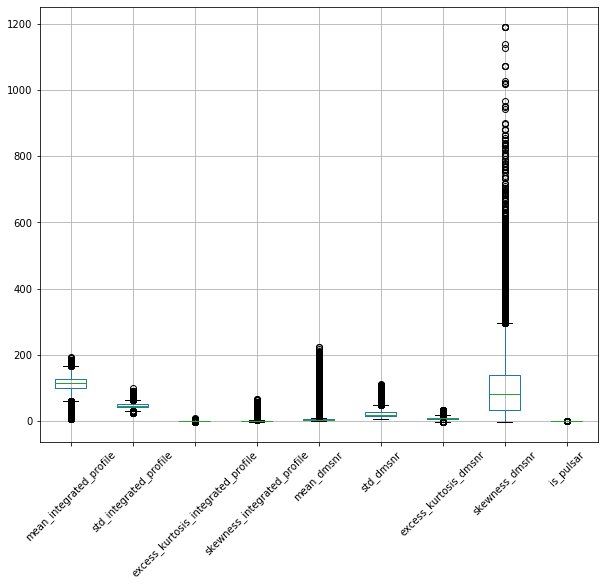

In [20]:
df.boxplot(rot=45,fontsize=10,figsize=(10,8))

Notamos que existen bastantes datos atípicos, pero los mantendremos pues seguramente estos ayuden a distiguir se le dato proviene de un pulsar o no.


<a id='visualization'></a>

## Visualización

* Histogramas.
* Scatter matrix coloreando por el _target_.
* Mapa de calor con correlación entre variables.

Puedes utilizar `matplotlib` o `altair`, como sea de tu preferencia.

In [21]:
import altair as alt
import matplotlib.pyplot as plt

alt.themes.enable("opaque")

%matplotlib inline

Primero, adjuntamos los histogramas de cada columna

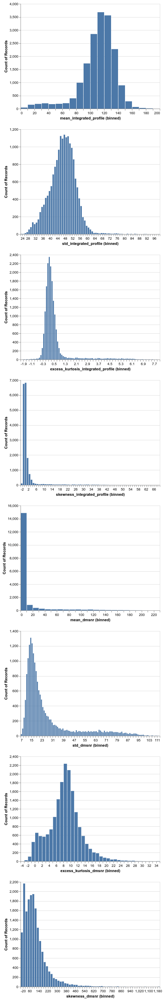

In [22]:
## HACEMOS LOS HISTOGRAMAS UNO POR UNO PUES DESEAMOS CAMBIAR EL ANCHO DE LAS BARRAS EN CADA CASO.

h1=alt.Chart(df).mark_bar().encode(
    alt.X('mean_integrated_profile', bin=alt.Bin(step=10), type='quantitative'),
    y='count()'
)
h2=alt.Chart(df).mark_bar().encode(
    alt.X('std_integrated_profile', bin=alt.Bin(step=1), type='quantitative'),
    y='count()'
)
h3=alt.Chart(df).mark_bar().encode(
    alt.X('excess_kurtosis_integrated_profile', bin=alt.Bin(step=0.1), type='quantitative'),
    y='count()'
)
h4=alt.Chart(df).mark_bar().encode(
    alt.X('skewness_integrated_profile', bin=alt.Bin(step=1), type='quantitative'),
    y='count()'
)

h5=alt.Chart(df).mark_bar().encode(
    alt.X('mean_dmsnr', bin=alt.Bin(step=10), type='quantitative'),
    y='count()'
)
h6=alt.Chart(df).mark_bar().encode(
    alt.X('std_dmsnr', bin=alt.Bin(step=1), type='quantitative'),
    y='count()'
)
h7=alt.Chart(df).mark_bar().encode(
    alt.X('excess_kurtosis_dmsnr', bin=alt.Bin(step=1), type='quantitative'),
    y='count()'
)
h8=alt.Chart(df).mark_bar().encode(
    alt.X('skewness_dmsnr', bin=alt.Bin(step=20), type='quantitative'),
    y='count()'
)

h1 & h2 & h3 & h4 & h5 & h6 & h7 & h8 

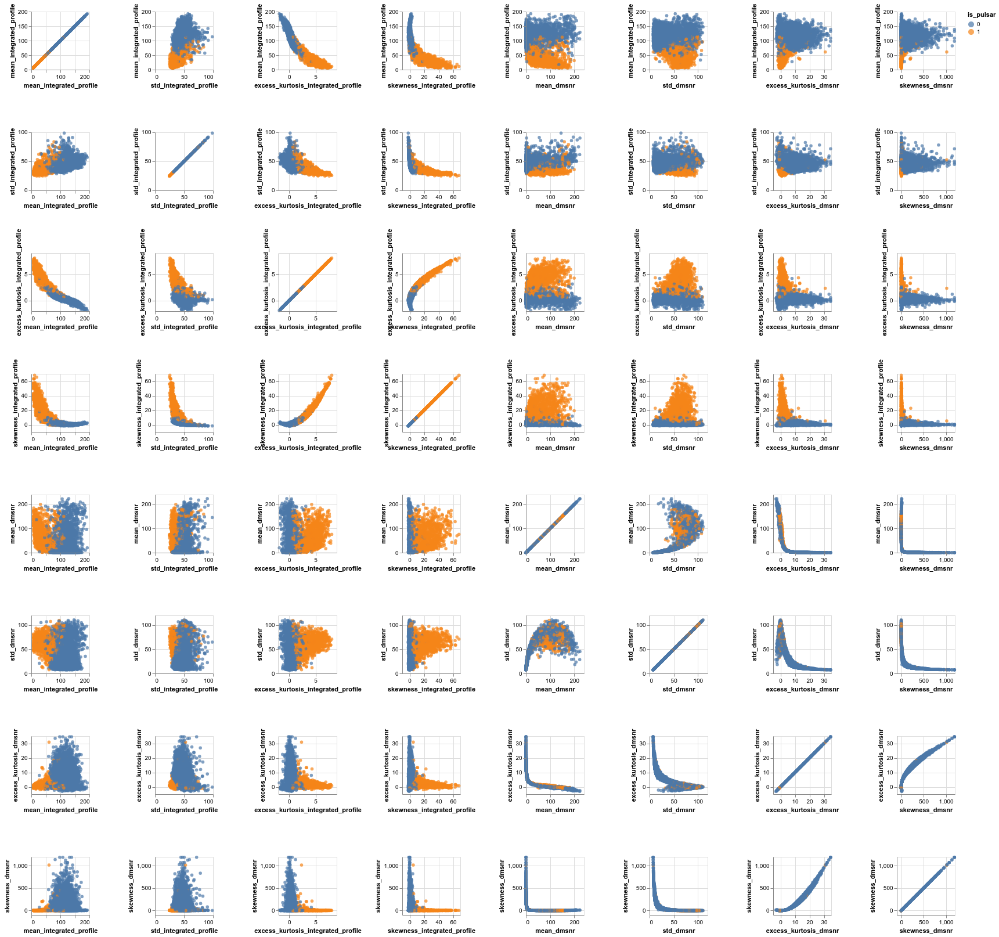

In [23]:
alt.Chart(df).mark_circle().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
    color='is_pulsar:N'
).properties(
    width=100,
    height=100
).repeat(
    row=['mean_integrated_profile','std_integrated_profile','excess_kurtosis_integrated_profile',
 'skewness_integrated_profile','mean_dmsnr','std_dmsnr','excess_kurtosis_dmsnr','skewness_dmsnr'],
    column=['mean_integrated_profile','std_integrated_profile','excess_kurtosis_integrated_profile',
 'skewness_integrated_profile','mean_dmsnr','std_dmsnr','excess_kurtosis_dmsnr','skewness_dmsnr'],
)

Podemos notar que algunos gráficos presentan una clara distinción entre los datos que pertenecen a púlsares y los que no. Las variables en que la distinción son:

- Exceso de curtosis del perfil integrado.
- Coeficiente de asimetría del perfil integrado.
- Media del perfil integrado.


In [24]:
corrMatrix = df.corr().round(2).reset_index().rename(
    columns = {'index':'Var1'}).melt(id_vars = ['Var1'],
                                    value_name = 'Corr',
                                       var_name = 'Var2')
corrMatrix.head()

,Var1,Var2,Corr
0,mean_integrated_profile,mean_integrated_profile,1.00
1,std_integrated_profile,mean_integrated_profile,0.55
2,excess_kurtosis_integrated_profile,mean_integrated_profile,-0.87
3,skewness_integrated_profile,mean_integrated_profile,-0.74
4,mean_dmsnr,mean_integrated_profile,-0.30


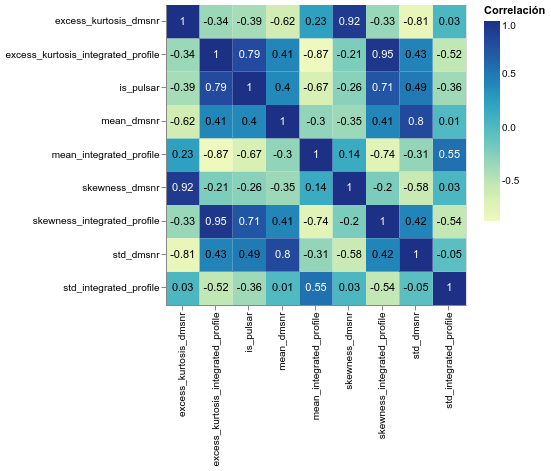

In [34]:
heat_map=alt.Chart(corrMatrix).mark_rect().encode(
    alt.X('Var1:O',title=''),
    alt.Y('Var2:O',title=''),
    alt.Color('Corr:Q',title='Correlación')
).properties(
    width=300,
    height=300
)
texto=alt.Chart(corrMatrix).mark_text().encode(
    alt.X('Var1:O',title=''),
    alt.Y('Var2:O',title=''),
    alt.Text('Corr:Q'),
    color=alt.condition(
        alt.datum['Corr'] <= 0.50,
        alt.value('black'),
        alt.value('white'))
).properties(
    width=300,
    height=300
)

heat_map+texto

<a id='preprocessing'></a>

## Preprocesamiento

Es hora de preparar los datos para la selección de modelos. Se solicita que:

* Crear el _numpy.array_ `X_raw` con las columnas predictoras de `df`.
* Crear el _numpy.array_ `y` con la columna a predecir de `df`.
* Definir un _transformer_ `StandarScaler` declarado como `scaler`, luego ajustar con los datos de `X_raw`.
* Definir el _numpy.array_ `X` luego de transformar los datos de `X_raw` con `scaler`. Verificar que tenga media nula y desviación estándar unitaria.
* Dividir la data en _train_ (90%) y _test_ (10%) utilizando como argumento `random_state=42`.

In [39]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [40]:
X_raw = df.drop(columns='is_pulsar').values
y = df['is_pulsar']

In [62]:
scaler =StandardScaler()
scaler.fit(X_raw)
X=scaler.transform(X_raw)
print('Media: ',round(X.mean(),4))
print('Desviación Estandar: ',X.std())



Media:  0.0
Desviación Estandar:  1.0


In [69]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.10, random_state=42)

print(np.shape(X_train))
print(np.shape(X_test))
print(np.shape(y_train))
print(np.shape(X_test))

(16108, 8)
(1790, 8)
(16108,)
(1790, 8)


<a id='logistic'></a>

## Regresión Logística

Utiliza la función `cross_validate` con el estimador `logistic` para realizar una estimación del _score_

In [71]:
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression

In [78]:
logistic = LogisticRegression()
logistic_cv = cross_validate(logistic,X_train,y=y_train,cv=10,scoring='precision')

In [79]:
print(f'Logistic Regression Cross Validation precision score: {np.mean(logistic_cv["test_score"]):.2f} +/- {np.std(logistic_cv["test_score"]):.2f}')

Logistic Regression Cross Validation precision score: 0.94 +/- 0.02


In [87]:
logistic.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

<a id='knn'></a>

## K Nearest Neighbours

Utiliza `GridSearchCV` para encontrar el mejor valor de `n_neighbors`. Luego, con el mejor _estimator_ de `knn` realiza la validación cruzada para obtener el intervalo de confianza del _score_.

In [97]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

In [112]:
parameters={'n_neighbors': np.arange(1, 101)}
knn_gscv =  GridSearchCV(KNeighborsClassifier(),parameters,scoring='precision',verbose=True,cv=10,n_jobs=-1)
knn=knn_gscv.fit(X_train,y_train)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:   24.1s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:   33.3s finished


In [113]:
mejor_knn=knn_gscv.best_estimator_.fit(X_train,y_train)

In [114]:
knn_cv = cross_validate(mejor_knn,X_train,y=y_train,cv=10,scoring='precision')

In [115]:
print(f'KNN Cross Validation precision score: {np.mean(knn_cv["test_score"]):.2f} +/- {np.std(knn_cv["test_score"]):.2f} with train data.')

KNN Cross Validation precision score: 0.95 +/- 0.02 with train data.


<a id='free_style'></a>

## Modelo a elección

* Escoge un modelo de clasificación de [aquí](https://scikit-learn.org/stable/supervised_learning.html#supervised-learning) que por lo menos tenga un hiperparámetro, por ejemplo, [sklearn.svm.SVC](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC) tiene el parámetro de regularización `C`.
* Explica en uno o dos párrafos en qué consiste el algoritmo/modelo.
* Al igual que KNN, encuentra el/los mejores valores para los hiperparámetros.
* Con el mejor estimador realiza _Cross Validation_ con los datos de entrenamiento.
* Calcula el intervalo de confianza de _precision_.

In [122]:
from sklearn.linear_model import RidgeClassifier

El modelo elegido es `RidgeClassifier`, que es un modelo que clasifica los datos transformando la variable target a los valores {-1,1} y luego aplicando el modelo de regresión de Ridge, que es un modelo de minimos cuadrados penalizado:

$$ \text{Mín} \Vert Ax - b \Vert_{2}^{2} + \alpha \Vert x \Vert_{2}^{2} $$

El hiperparámetro de este modelo es $\alpha$, que corresponde a $C^{-1}$ en otros modelos como **SVC** y representa el peso de la penalización.

In [144]:
my_model = RidgeClassifier
parameters={'alpha': [0.1,0.2,0.3,0.4,0.5, 0.6,0.7,0.8,0.9,1]+list(np.arange(10,1000,10))}

In [145]:
my_model_gscv = GridSearchCV(RidgeClassifier(),parameters,scoring='precision',verbose=True,cv=10,n_jobs=-1)
my_model=my_model_gscv.fit(X_train,y_train)

Fitting 10 folds for each of 109 candidates, totalling 1090 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 976 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 1090 out of 1090 | elapsed:    4.5s finished


In [146]:
my_model.best_params_

{'alpha': 470}

In [147]:
my_best_model=my_model_gscv.best_estimator_.fit(X_train,y_train)
my_model_cv = cross_validate(my_best_model,X_train,y=y_train,cv=10,scoring='precision')

In [148]:
print(f'MY MODEL Cross Validation precision score: {np.mean(my_model_cv["test_score"]):.2f} +/- {np.std(my_model_cv["test_score"]):.2f} with train data.')

MY MODEL Cross Validation precision score: 0.98 +/- 0.02 with train data.


<a id='model_selection'></a>

## Selección de Modelo

* Compara la _precision_ entre cada uno de los modelos.
* Grafica la matriz de confusión para cada uno de los modelos.
* Calcula un intervalo de confianza del tiempo utilizado en el ajuste de cada modelo. Ver documentación de `cross_validate`.
* Gráficos o reportes adicionales.

In [159]:
from sklearn.metrics import precision_score, classification_report,plot_confusion_matrix

In [160]:
print(f'Logistic Regression test precision score: {precision_score(y_pred=logistic.predict(X_test),y_true=y_test)}')

Logistic Regression test precision score: 0.9424460431654677


In [161]:
print(f'KNN test precision score: {precision_score(y_pred=mejor_knn.predict(X_test),y_true=y_test)}')

KNN test precision score: 0.9847328244274809


In [162]:
print(f'Ridge Classifier test precision score: {precision_score(y_pred=my_best_model.predict(X_test),y_true=y_test)}')

MY MODEL test precision score: 0.9905660377358491


Text(0.5, 1.0, 'Matiz de confusión Modelo Clasificador Ridge')

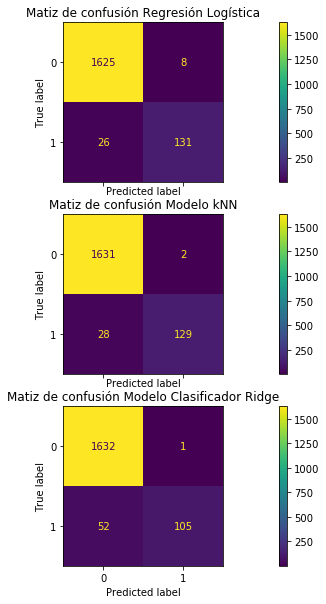

In [177]:
fig, (ax1, ax2,ax3) = plt.subplots(3, 1, sharex=True,figsize=(20, 10))
plot_confusion_matrix(logistic, X_test, y_test,ax=ax1,values_format='d')
ax1.set_title('Matiz de confusión Regresión Logística')
plot_confusion_matrix(mejor_knn, X_test, y_test,ax=ax2,values_format='d')
ax2.set_title('Matiz de confusión Modelo kNN')
plot_confusion_matrix(my_best_model, X_test, y_test,ax=ax3,values_format='d')
ax3.set_title('Matiz de confusión Modelo Clasificador Ridge')

In [174]:
print(f'Logistic Regression Cross Validation fitting score: {np.mean(logistic_cv["fit_time"]):.4f} +/- {np.std(logistic_cv["fit_time"]):.4f} with train data.')
print('\n')
print(f'KNN Cross Validation fitting score: {np.mean(my_model_cv["fit_time"]):.4f} +/- {np.std(knn_cv["fit_time"]):.4f} with train data.')
print('\n')
print(f'Ridge Classifier Cross Validation fitting score: {np.mean(my_model_cv["fit_time"]):.4f} +/- {np.std(my_model_cv["fit_time"]):.4f} with train data.')

Logistic Regression Cross Validation fitting score: 0.0837 +/- 0.0131 with train data.


KNN Cross Validation fitting score: 0.0115 +/- 0.0058 with train data.


Ridge Classifier Cross Validation fitting score: 0.0115 +/- 0.0021 with train data.


<a id='conclusions'></a>

## Conclusiones

Entrega tu veredicto, responde las preguntas iniciales, visualizaciones, trabajos futuros, dificultados, etc.

El modelo que precenta una mejor precisión es el de Clasificación Ridge, con un score de 0.990, seguido muy de cerca por el modelo kNN, con un score de 0.984. El modelo Logístico tiene un score de 0.942, que es considerablemente menor.

En cuanto al tiempo de ajuste, podemos decir que los modelos de Clasificación de Ridge y kNN son igual de rápidos, aunque el de Clasificación de Ridge es ligeramente más confiable en el sentido que tiene una desviación estandar menor. Nuevamente, el modelo de Regresión logística presenta un pobre desempeño, siendo 8 veces más lento que los otros.

En relación a la métrica que utilizamos, se escogió la precisión pues es el ratio de verdaderos positivos sobre el total de positivos. En ese sentido, la métrica precisión castiga los falsos negativos, lo que es exactamente lo deseado tomando en cuenta que el modelo será utilizado para clasificar posibles púlsares, por lo que no deseamos analizar falsos positivos 8pérdida de tiempo)

Tomando en cuenta todos estos factores es que decidimos 